### Ising Model Simulations

The Ising model comprises $N$ spins $S_{i}$ on a lattice (so that $i = 1, . . . , N$), each of which can point up, $S_{i} = 1$, or down, $S_{i} = −1$.
Each neighbouring pair of aligned spins lowers the energy of the system by an amount $J > 0$. Thus, given a spin configuration ${S_{i}}$, the total energy is:

$$ \hspace{-10em} E({S_{i}}) = −J \sum_{<i,j>} S_{i}S_{j}$$

where the sum is over all distinct nearest neighbour pairs $<i,j>$.
According to the Boltzmann distribution, that probability of observing a given configuration ${S_{i}}$ at equilibrium is:

$$ \hspace{-10em} P({S_{i}}) = \exp(−\frac{E({Si})}{k_{B}T})$$

where $k_{B}$ is Boltzmann’s constant and $T$ is the temperature.
As the physics of the system is determined by the ratio between $J$ and $k_{B}T$ (which enters the Boltzmann weight), we can take any two of $J$, $k_{B}$ and $T$
equal to unity with no loss of generality – in practice calculations normally have $J = k_{B} = 1$.

In [1]:
import math
import numpy as np
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
import seaborn as sns
import csv
from numba import njit
from IPython.display import HTML

sns.set_style("whitegrid")
mpl.rcParams.update({
    'font.size':         17,
    'axes.edgecolor':   'black',
    'axes.labelcolor':  'black',
    'xtick.color':      'black',
    'ytick.color':      'black',
    'axes.facecolor':   'none' ,
    'figure.facecolor': 'none'
})
mpl.rcParams.update({"animation.html":"jshtml"})

### Glauber Dynamics

One way to sample an equilibrium state of the Ising model is to use Glauber dynamics in conjunction with the Metropolis algorithm.

Specifically, one chooses a site i at random, and considers the effect of flipping the spin at this site. Let the resulting change in energy if the move
is actually performed be $\Delta E$. Then, if $\Delta E ≤ 0$, the spin flip is always flipped; otherwise it is flipped only with probability $\exp(−\frac{\Delta E}{k_{B}T})$.

In [2]:
# Energy difference function for both Glauber and Kawasaki dynamics
@njit
def calculate_delta_e(lattice , x, y):
    item = lattice[x][y]

    delta_e = 2 * item * (lattice[(x+1) % n][y] + lattice[(x-1)%n][y] +
                          lattice[x][(y+1)%n] + lattice[x][(y-1)%n])
    return delta_e

In [4]:
# Choose a random spin and flip it based on the difference in energy between original and unflipped state
@njit
def flip(lattice, n, T):
    row_index = random.randint(0,n-1)
    column_index = random.randint(0,n-1)

    flipped_item = -1 * lattice[row_index][column_index]
    delta_e = calculate_delta_e(lattice, row_index, column_index)

    if delta_e <= 0:
        lattice[row_index][column_index] = flipped_item
    else:
        if np.random.random() < np.exp(- delta_e / T):
            lattice[row_index][column_index] = flipped_item
    return lattice


### Kawasaki Dynamics

An alternative way to sample an equilibrium state of the Ising model is to use Kawasaki dynamics. Here, one chooses randomly two distinct
sites $i$ and $j$ (these may also be nearest neighbours), and considers the effect of exchanging this pair of spins.
Again, a decrease in energy means the exchange is then made; otherwise it is made with probability $\exp(−\frac{\Delta E}{k_{B}T})$ where $\Delta E$ is the change
in energy that would result from the exchange.


In [3]:
# Choose two random spins and switch them based on the difference in energy between original and unflipped state
@njit
def switch(lattice, n, T):
    row_i = random.randint(0,n-1)
    col_i = random.randint(0,n-1)

    row_j = random.randint(0,n-1)
    col_j = random.randint(0,n-1)

    if lattice[row_i][col_i] == lattice[row_j][col_j]:
        return lattice
    else:
        delta_e = calculate_delta_e(lattice, row_i,col_i) + calculate_delta_e(lattice, row_j,col_j)
        if delta_e <= 0:
            lattice[row_i][col_i] = -1 * lattice[row_i][col_i]
            lattice[row_j][col_j] = -1 * lattice[row_j][col_j]
        else:
            if np.random.random() < np.exp(- delta_e / T):
                lattice[row_i][col_i] = -1 * lattice[row_i][col_i]
                lattice[row_j][col_j] = -1 * lattice[row_j][col_j]
    return lattice

### Animations

Write a Python program to simulate the Ising model on the two-dimensional square lattice with periodic boundary conditions (you should ideally use
a $50 × 50$ square lattice). Your program should allow the user to choose the system size, temperature and the dynamics that are used (Glauber or Kawasaki),
when running the code.

In [6]:
def create_video(n, T, dyn, frame_number):
    mpl.rcParams.update({"axes.grid" : False})
    t = T
    n = n
    global lattice
    lattice = np.random.choice([1,-1],(n,n))
    global sweeps
    sweeps = 0
    fig = plt.figure(figsize= (8,8))
    plot = plt.imshow(lattice)
    fig.suptitle(f"{dyn} Dynamics  T = {t}, # flip attempts = {sweeps}")

    if(dyn == "Glauber"):
        def animate(i):
            global lattice
            global sweeps
            plot.set_array(lattice)
            for _ in range(2500):
                lattice = flip(lattice, n, t)
            sweeps += 1
            fig.suptitle(f"Glauber Dynamics  T = {t}, # sweeps = {sweeps}", y=0.95)
            return plot,
    else:
        def animate(i):
            global lattice
            global sweeps
            for _ in range(2500):
                lattice = switch(lattice, n, T)
            sweeps += 1
            plot.set_array(lattice)
            fig.suptitle(f"Kawasaki Dynamics  T = {t}, # sweeps = {sweeps}", y=0.95)
            return plot,

    ani = animation.FuncAnimation(fig, animate, frames=frame_number, interval=40, blit=True)
    plt.close()


    return HTML(ani.to_jshtml())

In [7]:
def create_video(n, temps, dyn, frame_number):
    mpl.rcParams.update({"axes.grid" : False})
    temps = list(temps)
    n = n
    global lattice1
    global lattice2
    global lattice3
    lattice1 = np.random.choice([1,-1],(n,n))
    lattice2 = np.random.choice([1,-1],(n,n))
    lattice3 = np.random.choice([1,-1],(n,n))
    global lattices
    lattices = [lattice1, lattice2, lattice3]
    global sweeps
    sweeps = 0
    fig, axs = plt.subplots(1,3, figsize= (12, 6))
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
    for x in range(3):
        axs[x].set_title(f"T = {temps[x]}")
    plot1 = axs[0].imshow(lattice1)
    plot2 = axs[1].imshow(lattice2)
    plot3 = axs[2].imshow(lattice3)
    plots = [plot1,plot2,plot3]
    fig.suptitle(f"{dyn} Dynamics  T = fix, # flip attempts = {sweeps}")

    if(dyn == "Glauber"):
        def animate(i):
            global lattices
            global sweeps
            for x in range(3):
                plots[x].set_array(lattices[x])
            for _ in range(2500):
                for x in range(3):
                    lattices[x] = flip(lattices[x], n, temps[x])
            sweeps += 1
            fig.suptitle(f"Glauber Dynamics   # sweeps = {sweeps}", y=0.93)
            return plots
    else:
        def animate(i):
            global lattices
            global sweeps
            for x in range(3):
                plots[x].set_array(lattices[x])
            for _ in range(2500):
                for x in range(3):
                    lattices[x] = switch(lattices[x], n, temps[x])
            sweeps += 1
            fig.suptitle(f"Kawasaki Dynamics   # sweeps = {sweeps}", y=0.93)
            return plots

    ani = animation.FuncAnimation(fig, animate, frames=frame_number, interval=50, blit=True)
    plt.close()


    return HTML(ani.to_jshtml())

In [53]:
%%time
ani = create_video(50, [1,2.3,4], "Glauber", 500)
ani

CPU times: total: 34.2 s
Wall time: 1min 12s


In [158]:
ani = create_video(50, [1,2.3,4], "Kawasaki", 300)
ani

### Measurements and Visualisations

The total magnetisation of a configuration ${S_{i}}$ is defined as $ M = \sum_{i} S_{i} $.

Use your program to estimate the average value of the total magnetisation in the equilibrium state, $\langle M \rangle$, and of the susceptibility

$$ \hspace{-10em}\chi = \frac{1}{N k_{B} T}($\langle M^{2} \rangle$ - $\langle M \rangle$^{2}) $$

and also the average value of the total energy, $\langle E \rangle$, and the scaled heat
capacity (or heat capacity per spin)

$$ \hspace{-10em}C = \frac{1}{N k_{B} T^{2}}($\langle E^{2} \rangle$ - $\langle E \rangle$^{2}) $$

Plot these as a function of temperature, T, and use one of the graphs to estimate the location of the critical temperature at which the system spontaneously magnetises under both Glauber and Kawasaki dynamics.








In [8]:
# Energy and magnetisation functions
def calculate_energy(lattice):
    return - np.sum(np.roll(lattice, 1, axis = 1) * lattice) - np.sum(np.roll(lattice, 1, axis = 0) * lattice)

@njit
def calculate_mag(lattice):
    return np.sum(lattice)

In [9]:
%%time
## GLAUBER DATA GENERATION

n = 50
global lattice
lattice = np.full(shape=(n, n), fill_value=-1)
sweep = 2500
measurement_number = 1000

temps = np.arange(1,3.1,0.1)
temps = np.round(temps, decimals=1)

file_glauber = open("glauber3.csv", "w", newline='')

writer_glauber = csv.writer(file_glauber)
writer_glauber.writerow(["Temperature", "Magnetisation", "Energy"])

for temp in temps:
    for i in range(100*sweep):
        lattice = flip(lattice,n,temp)
    for _ in range(measurement_number):
        for _ in range(10*sweep):
            lattice = flip(lattice, n, temp)
        writer_glauber.writerow([temp, calculate_mag(lattice), calculate_energy(lattice)])


CPU times: total: 8min 27s
Wall time: 14min 48s


In [57]:
glauber_data = pd.read_csv('glauber.csv')

In [58]:
# Calculate susceptibility and specific heat (cv)
vars = glauber_data.groupby('Temperature').var().reset_index()
sus = vars['Magnetisation'] / (vars['Temperature'] * n * n)

means = glauber_data.groupby(['Temperature']).mean().reset_index()
mean_squares = (glauber_data**2).groupby(['Temperature']).mean().reset_index()
cv = (mean_squares['Energy'] - means['Energy']**2) / (n*means['Temperature'])**2

glauber_data['Magnetisation'] = glauber_data['Magnetisation'].abs()
means_abs = glauber_data.groupby(['Temperature']).mean().reset_index()

In [59]:
# Calculate critical temperature
index = sus.idxmax()
critical_temp_glauber = means['Temperature'].iloc[int(index)]

In [60]:
# Create dataframe to store data for plots
means['Magnetisation'] = means_abs['Magnetisation']
glauber_df = means.assign(CV=cv).assign(Susceptibility = sus)

In [ ]:
%%time
## GLAUBER ERROR CALCULATION - BOOTSTRAPING

n = 50
n_resamples = 1000
n_values = 1000
glauber_errors = {}

for temp in temps:
    df = glauber_data.loc[glauber_data['Temperature'] == temp]
    suss = []
    cvs = []
    for _ in range(n_resamples):
        mag_values =  df["Magnetisation"].sample(n_values, replace = True)
        energy_values = df["Energy"].sample(n_values, replace = True)
        sus = ((mag_values**2).mean() - mag_values.mean()**2)/(n*n*temp)
        cv = ((energy_values**2).mean() - energy_values.mean()**2)/(n*temp)**2
        cvs.append(cv)
        suss.append(sus)
    cvs = pd.Series(cvs)
    suss = pd.Series(suss)
    cv_error = math.sqrt((cvs**2).mean() - cvs.mean()**2)
    sus_error = math.sqrt((suss**2).mean() - suss.mean()**2)
    glauber_errors[temp] = [sus_error, cv_error]


CPU times: total: 13.2 s
Wall time: 25.2 s


In [62]:
# Add errors to dataframe and create corresponding csv
glau_errors = list(glauber_errors.values())
sus_error = [x[0] for x in glau_errors]
cv_error = [x[1] for x in glau_errors]
glauber_df = glauber_df.assign(SUS_error = sus_error).assign(CV_error = cv_error)
glauber_df = glauber_df.round(decimals = 6)
glauber_df.to_csv("glauber_plot_data.csv", index = False)


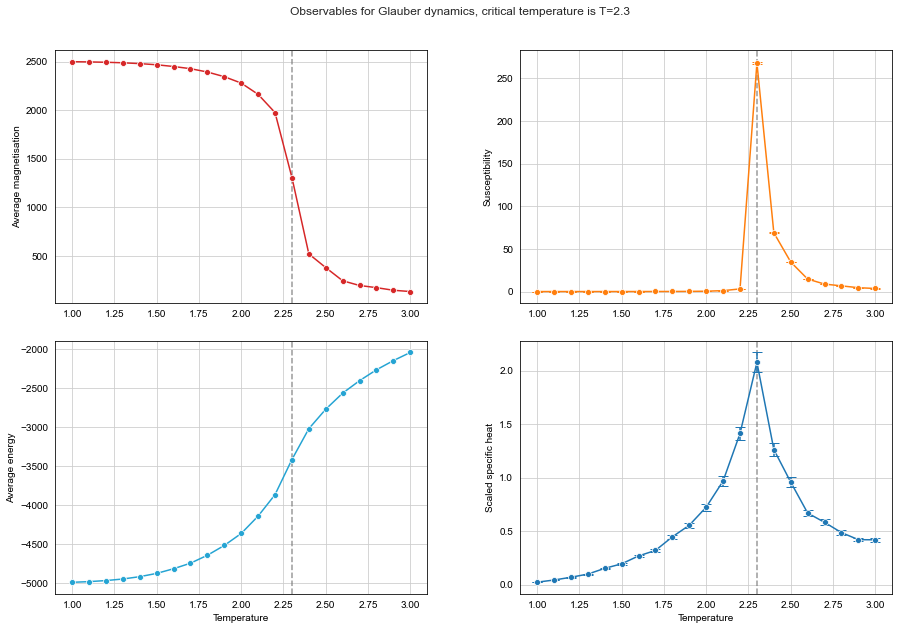

In [63]:
# PLOTS OF GLAUBER OBSERVABLES
mpl.rcParams.update({"axes.grid" : True})
fig, ax = plt.subplots(2,2, figsize=(15,10))
colors = sns.color_palette()

ax[0,0].axvline(critical_temp_glauber, linestyle = '--', color = 'gray', alpha = 0.8)
ax[0,1].axvline(critical_temp_glauber, linestyle = '--', color = 'gray', alpha = 0.8)
ax[1,0].axvline(critical_temp_glauber, linestyle = '--', color = 'gray', alpha = 0.8)
ax[1,1].axvline(critical_temp_glauber, linestyle = '--', color = 'gray', alpha = 0.8)

ax[0,1].errorbar(glauber_df['Temperature'], glauber_df['Susceptibility'], glauber_df['SUS_error'], marker='', capsize = 5, color = colors[1], linestyle = 'None')
ax[1,1].errorbar(glauber_df['Temperature'], glauber_df['CV'], yerr = glauber_df['CV_error'], marker='', capsize = 5, color = colors[0], linestyle = 'None')

sns.lineplot(x=glauber_df['Temperature'], y=glauber_df['Magnetisation'], marker='o', ax = ax[0,0], color = colors[3])
sns.lineplot(x=glauber_df['Temperature'], y=glauber_df['Susceptibility'], marker='o', ax = ax[0,1], color = colors[1])
sns.lineplot(x=glauber_df['Temperature'], y=glauber_df['Energy'], marker='o', ax = ax[1,0], color = "#25A4D3")
sns.lineplot(x=glauber_df['Temperature'], y=glauber_df['CV'], marker='o', ax = ax[1,1], color = colors[0])
ax[0,0].set_ylabel("Average magnetisation")
ax[0,1].set_ylabel("Susceptibility")
ax[1,0].set_ylabel("Average energy")
ax[1,1].set_ylabel("Scaled specific heat")
ax[1,0].set_xlabel("Temperature")
ax[1,1].set_xlabel("Temperature")
ax[0,0].set_xlabel("")
ax[0,1].set_xlabel("")

plt.subplots_adjust(hspace = 0.15, wspace = 0.25)
plt.suptitle(f"Observables for Glauber dynamics, critical temperature is T={critical_temp_glauber}", y=0.94)
plt.show()

In [64]:
%%time
## KAWASAKI DATA GENERATION

n = 50
global lattice
lattice = np.ones((n,n))
lattice[:n//2,:] = -1
sweep = 2500
measurement_number = 1000

temps = np.arange(1,3.1,0.1)
temps = np.round(temps, decimals=1)

file_kawasaki = open("kawasaki2.csv", "w", newline='')

writer_kawasaki = csv.writer(file_kawasaki)
writer_kawasaki.writerow(["Temperature", "Energy"])

for temp in temps:
    for i in range(100*sweep):
        lattice = switch(lattice,n,temp)
    for _ in range(measurement_number):
        writer_kawasaki.writerow([temp, calculate_energy(lattice)])
        for _ in range(10*sweep):
            lattice = switch(lattice, n, temp)

CPU times: total: 10min 31s
Wall time: 14min 36s


In [4]:
kawasaki_data = pd.read_csv('kawasaki.csv')

In [6]:
# Calculate specific heat (cv)
n=50
mean_squares_kawasaki = (kawasaki_data**2).groupby(['Temperature']).mean().reset_index()
means_kawasaki = kawasaki_data.groupby(['Temperature']).mean().reset_index()
cv_kawasaki = (mean_squares_kawasaki['Energy'] - means_kawasaki['Energy']**2) / (n*means_kawasaki['Temperature'])**2

In [7]:
# Calculate critical temperature
index = cv_kawasaki.idxmax()
critical_temp_kawasaki = means_kawasaki['Temperature'].iloc[index]

In [8]:
# Create dataframe to store data for plots
kawasaki_df = means_kawasaki.assign(CV=cv_kawasaki)

In [10]:
%%time
## KAWASAKI ERROR CALCULATION - BOOTSTRAPING
n = 50
n_resamples = 1000

kawasaki_errors = {}

temps = np.arange(1,3.1,0.1)
temps = np.round(temps, decimals=1)

for temp in temps:
    df = kawasaki_data.loc[kawasaki_data['Temperature'] == temp]
    cvs = []
    for _ in range(n_resamples):
        values = df["Energy"].sample(n_resamples, replace = True)
        cv = ((values**2).mean() - values.mean()**2)/(n*temp)**2
        cvs.append(cv)
    cvs = pd.Series(cvs)
    error = math.sqrt((cvs**2).mean() - cvs.mean()**2)
    kawasaki_errors[temp] = error

CPU times: total: 7.12 s
Wall time: 12.8 s


In [11]:
# Finish filling the dataframe and create the corresponding csv
kawa_errors = list(kawasaki_errors.values())
kawasaki_df = kawasaki_df.assign(CV_error = kawa_errors)
kawasaki_df = kawasaki_df.round(decimals = 6)
kawasaki_df.to_csv("kawasaki_plot_data.csv", index = False)

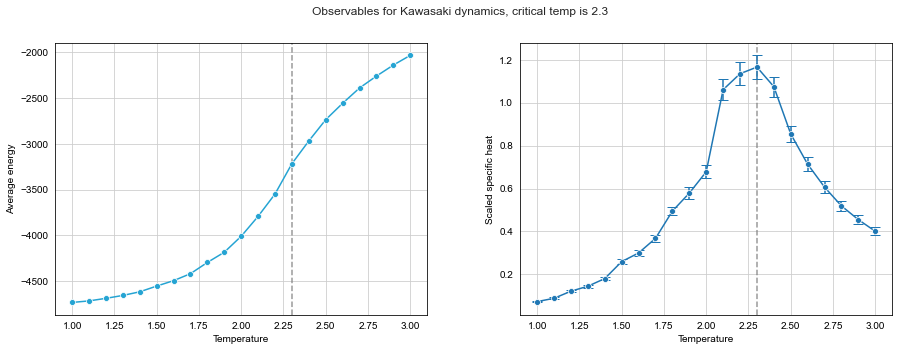

In [12]:
# PLOTS FOR KAWASAKI OBSERVABLES
mpl.rcParams.update({"axes.grid" : True})
fig, ax = plt.subplots(1,2, figsize=(15,5))
colors = sns.color_palette()

ax[0].axvline(critical_temp_kawasaki, linestyle = '--', color = 'gray', alpha = 0.8)
ax[1].axvline(critical_temp_kawasaki, linestyle = '--', color = 'gray', alpha = 0.8)

ax[1].errorbar(temps, cv_kawasaki, yerr = kawa_errors, marker='', capsize = 5, color = colors[0], linestyle = 'None')

sns.lineplot(x=kawasaki_df['Temperature'], y=kawasaki_df['Energy'], marker='o', ax = ax[0], color = "#25A4D3")
sns.lineplot(x=kawasaki_df['Temperature'], y=kawasaki_df['CV'], marker='o', ax = ax[1], color = colors[0])

ax[0].set_ylabel("Average energy")
ax[1].set_ylabel("Scaled specific heat")
ax[0].set_xlabel("Temperature")
ax[1].set_xlabel("Temperature")

plt.subplots_adjust(hspace = 0.15, wspace = 0.25)
plt.suptitle(f"Observables for Kawasaki dynamics, critical temp is {critical_temp_kawasaki}")
plt.show()